**LINMA 2472 Assignment 4: Network Analysis of Contacts in Workplace**


Sarra Laksaci, Sixto Castro Redbroban


##**0-Dependencies**

In [ ]:
!pip install pyvis
!pip install EoN
!pip install nxviz

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import csv
import nxviz as nv
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
#pip install pandas --upgrade
import math
import EoN

/usr/local/lib/python3.7/dist-packages/nxviz/__init__.py:29: UserWarning: 
nxviz has a new API! Version 0.7.2 onwards, the old class-based API is being
deprecated in favour of a new API focused on advancing a grammar of network
graphics. If your plotting code depends on the old API, please consider
pinning nxviz at version 0.7.2, as the new API will break your old code.

To check out the new API, please head over to the docs at
https://ericmjl.github.io/nxviz/ to learn more. We hope you enjoy using it!

(This deprecation message will go away in version 1.0.)

  """


##**1-Read data**


[Dataset link ](http://www.sociopatterns.org/datasets/contacts-in-a-workplace/)

In [ ]:
#read .dat file
datContent = [i.split() for i in open("/content/drive/MyDrive/Colab Notebooks/datasets/tij_InVS.dat").readlines()]

In [ ]:
class node:
    def __init__(self, id,cluster):
        self.id=id
        self.cluster=cluster
        self.internal = 0
        self.external = 0

s = node(10,0)
print(s.id)
print(s.internal)
print(s.external)

10
0
0


In [ ]:
#create dataframe from .dat data
df=pd.DataFrame(datContent,columns=['t','i','j'],dtype=np.int16)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: FutureWarning: Could not cast to int16, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
#view dataframe
print(df)

            t    i    j
0       28820  492  938
1       28860  267  272
2       29300  181  826
3       29780   79  181
4       30000  150  196
...       ...  ...  ...
9822  1015380  150  601
9823  1015400  150  601
9824  1015440  150  601
9825  1016420  150  601
9826  1016440  150  601

[9827 rows x 3 columns]


In [ ]:
df['hour'] = df['t'].apply(lambda x: math.floor(int(x)/3600))
df['day'] = df['t'].apply(lambda x: math.floor(int(x)/86400))
df['week'] = df['t'].apply(lambda x: math.floor(int(x)/604800))

In [ ]:
print('hours', df['hour'].unique())
print('days', df['day'].unique())
print('weeks', df['week'].unique())

hours [  8   9  10  11  12  13  14  15  16  17  18  32  33  34  35  36  37  38
  39  40  41  42  56  57  58  59  60  61  62  63  64  65  66  80  81  82
  83  84  85  86  87  88  89  90 104 105 106 107 108 109 110 111 112 113
 114 176 177 178 179 180 181 182 183 184 185 200 201 202 203 204 205 206
 207 208 209 210 224 225 226 227 228 229 230 231 232 233 234 248 249 250
 251 252 253 254 255 256 257 272 273 274 275 276 277 278 279 280 281 282]
days [ 0  1  2  3  4  7  8  9 10 11]
weeks [0 1]


In [ ]:
##SET SPECIFIC DAY

In [ ]:
df_1d=df[(df['day']==0)]
print(df_1d)
print(df_1d['hour'].unique())
print(df_1d['day'].unique())

          t    i    j  hour  day  week
0     28820  492  938     8    0     0
1     28860  267  272     8    0     0
2     29300  181  826     8    0     0
3     29780   79  181     8    0     0
4     30000  150  196     8    0     0
...     ...  ...  ...   ...  ...   ...
1153  64280  120  765    17    0     0
1154  64360  120  765    17    0     0
1155  64480  120  494    17    0     0
1156  64700  172  196    17    0     0
1157  65060  275  804    18    0     0

[1158 rows x 6 columns]
[ 8  9 10 11 12 13 14 15 16 17 18]
[0]


In [ ]:
##SET SPECIFIC WEEK

In [ ]:
df_1w=df[(df['week']==0)]
print(df_1w)
print(df_1w['hour'].unique())

           t    i    j  hour  day  week
0      28820  492  938     8    0     0
1      28860  267  272     8    0     0
2      29300  181  826     8    0     0
3      29780   79  181     8    0     0
4      30000  150  196     8    0     0
...      ...  ...  ...   ...  ...   ...
4660  411560   15  123   114    4     0
4661  411580   15  123   114    4     0
4662  411840   15  123   114    4     0
4663  411860   15  123   114    4     0
4664  411880   15  123   114    4     0

[4665 rows x 6 columns]
[  8   9  10  11  12  13  14  15  16  17  18  32  33  34  35  36  37  38
  39  40  41  42  56  57  58  59  60  61  62  63  64  65  66  80  81  82
  83  84  85  86  87  88  89  90 104 105 106 107 108 109 110 111 112 113
 114]


In [ ]:
df_nodes=df.iloc[:,1:]
print(df_nodes)

        i    j  hour  day  week
0     492  938     8    0     0
1     267  272     8    0     0
2     181  826     8    0     0
3      79  181     8    0     0
4     150  196     8    0     0
...   ...  ...   ...  ...   ...
9822  150  601   282   11     1
9823  150  601   282   11     1
9824  150  601   282   11     1
9825  150  601   282   11     1
9826  150  601   282   11     1

[9827 rows x 5 columns]


In [ ]:
#detected duplicated edges, aka people who saw each other more than once during the project
dupli=df_nodes.duplicated()
dupli

0       False
1       False
2       False
3       False
4       False
        ...  
9822    False
9823     True
9824     True
9825     True
9826     True
Length: 9827, dtype: bool

In [ ]:
#open metadata
metaContent = [i.split() for i in open("/content/drive/MyDrive/Colab Notebooks/datasets/metadata_1.txt").readlines()]

In [ ]:
#view metadata
metaContent

[['35', 'DISQ'],
 ['184', 'DISQ'],
 ['751', 'DISQ'],
 ['255', 'DISQ'],
 ['131', 'DISQ'],
 ['273', 'DISQ'],
 ['743', 'DISQ'],
 ['210', 'DISQ'],
 ['826', 'DISQ'],
 ['265', 'DISQ'],
 ['845', 'DISQ'],
 ['185', 'DISQ'],
 ['268', 'DISQ'],
 ['778', 'DISQ'],
 ['253', 'DISQ'],
 ['172', 'DSE'],
 ['513', 'DSE'],
 ['29', 'DSE'],
 ['272', 'DSE'],
 ['79', 'DSE'],
 ['181', 'DSE'],
 ['196', 'DSE'],
 ['56', 'DSE'],
 ['164', 'DSE'],
 ['242', 'DSE'],
 ['223', 'DSE'],
 ['120', 'DSE'],
 ['311', 'DSE'],
 ['496', 'DSE'],
 ['132', 'DSE'],
 ['819', 'DSE'],
 ['603', 'DSE'],
 ['267', 'DSE'],
 ['222', 'DSE'],
 ['205', 'DSE'],
 ['662', 'DSE'],
 ['113', 'DSE'],
 ['123', 'DSE'],
 ['39', 'DSE'],
 ['779', 'DSE'],
 ['95', 'DSE'],
 ['791', 'DSE'],
 ['194', 'DSE'],
 ['786', 'DSE'],
 ['15', 'DSE'],
 ['494', 'DSE'],
 ['765', 'DSE'],
 ['987', 'DSE'],
 ['939', 'DSE'],
 ['87', 'SFLE'],
 ['213', 'SFLE'],
 ['211', 'SFLE'],
 ['116', 'SFLE'],
 ['209', 'DMCT'],
 ['938', 'DMCT'],
 ['875', 'DMCT'],
 ['179', 'DMCT'],
 ['80', 'DMCT'],

##**3- Explore data**

In [ ]:
df.info()
#df2=df_1d.copy()
#df2=df_1w.copy()
df2=df.copy()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9827 entries, 0 to 9826
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   t       9827 non-null   object
 1   i       9827 non-null   object
 2   j       9827 non-null   object
 3   hour    9827 non-null   int64 
 4   day     9827 non-null   int64 
 5   week    9827 non-null   int64 
dtypes: int64(3), object(3)
memory usage: 460.8+ KB


In [ ]:
#extract nodes from the data
nodes=[ i for i in df2['i'].unique()]
for i in df2['j'].unique():
  nodes.append(i)

nodes=list(set(nodes))


In [ ]:
#get number of nodes in the graph
len(nodes)

92

In [ ]:
#build dictionary of ID:department for all employe using the metadata
dic_departements={}
for element in metaContent:
  dic_departements[element[0]]=element[1]

In [ ]:
### Some people mentioned in the face-to-face contact data were not reported in the metadata
#add unknown label for unlisted people 
for i in nodes:
  if i not in dic_departements.keys():
    dic_departements[i]='UNK'

In [ ]:
###NEW

In [ ]:
#build dictionary of ID:department for all employe using the metadata
dic_departements={}
for element in metaContent:
  dic_departements[element[0]]=element[1]

dic_departements = {int(k): v for k,v in dic_departements.items()}


nodes=[]
df2['i'] = df2['i'].astype(int)
df2['j'] = df2['j'].astype(int)

for i in df2['i'].unique():
  if i in dic_departements.keys():
    nodes.append(i)

for i in df2['j'].unique():
  if i in dic_departements.keys():
    nodes.append(i)

nodes=list(set(nodes))
#get number of nodes in the graph
len(nodes)

92

In [ ]:
dic_departements.keys()

dict_keys([35, 184, 751, 255, 131, 273, 743, 210, 826, 265, 845, 185, 268, 778, 253, 172, 513, 29, 272, 79, 181, 196, 56, 164, 242, 223, 120, 311, 496, 132, 819, 603, 267, 222, 205, 662, 113, 123, 39, 779, 95, 791, 194, 786, 15, 494, 765, 987, 939, 87, 213, 211, 116, 209, 938, 875, 179, 80, 21, 101, 48, 511, 102, 762, 66, 134, 17, 119, 771, 784, 105, 118, 431, 285, 240, 804, 335, 50, 275, 709, 533, 448, 481, 154, 122, 492, 153, 601, 271, 63, 150, 499])

In [ ]:
### Some people mentioned in the metadata were not reported in the face-to-face contact data
#store these people in the abscent list
abscents=[]
for k in dic_departements.keys():
  if k not in nodes:
    abscents.append(k)

In [ ]:
#proof
print(f" employe ID 35 was captured in the face-to-face contact study data: {'35' in (df['j'].value_counts()).keys()}")
#print(f" employe ID 164 was captured in the face-to-face contact study data: {'39' in k_list}")

 employe ID 35 was captured in the face-to-face contact study data: False


##**4-Build graph**

In [ ]:
#create graph structure
dict_neighbours={}
G=nx.Graph()
#add nodes
#G.add_nodes_from(node)
#add edges
for idx,row in df2.iterrows():
  t= int(row['t'])
  left = int(row['i'])
  right= int(row['j'])
  if (left not in dict_neighbours):
    dict_neighbours[left]=[]
  if(right not in dict_neighbours):
    dict_neighbours[right]=[]
  
  if (dupli[idx]==False and ((left in nodes) and (right in nodes))):
    if(right not in dict_neighbours.get(left)):
      dict_neighbours[left].append(right)
    if(left not in dict_neighbours.get(right)):
      dict_neighbours[right].append(left)
    G.add_edge(left,right,time=t)


In [ ]:
print(left)
print(dict_neighbours[left])

150
[196, 21, 271, 601, 762, 154, 285, 533, 131, 481, 209, 709, 153, 63, 116, 499, 119, 804, 213, 223, 448, 123]


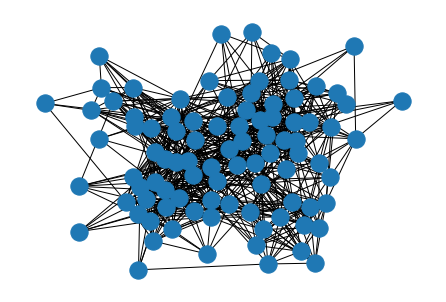

In [ ]:
#default networkx visualization 
import matplotlib.pyplot as plt
nx.draw(G)
plt.show()

In [ ]:
G.edges(data=True)

EdgeDataView([(492, 938, {'time': 28820}), (492, 601, {'time': 393180}), (492, 123, {'time': 119980}), (492, 271, {'time': 842840}), (492, 153, {'time': 841200}), (492, 154, {'time': 836600}), (492, 448, {'time': 223260}), (492, 499, {'time': 223420}), (492, 119, {'time': 311220}), (492, 63, {'time': 388800}), (938, 240, {'time': 1009880}), (938, 804, {'time': 140400}), (938, 431, {'time': 736460}), (938, 875, {'time': 1011760}), (267, 272, {'time': 28860}), (267, 222, {'time': 1011980}), (267, 311, {'time': 739400}), (267, 205, {'time': 811820}), (267, 496, {'time': 829780}), (267, 223, {'time': 48280}), (267, 184, {'time': 48380}), (267, 39, {'time': 811920}), (267, 603, {'time': 985020}), (267, 164, {'time': 120960}), (267, 120, {'time': 134920}), (267, 939, {'time': 307320}), (267, 105, {'time': 381040}), (267, 513, {'time': 381100}), (267, 116, {'time': 307280}), (267, 56, {'time': 307300}), (267, 95, {'time': 748800}), (267, 662, {'time': 317040}), (267, 196, {'time': 317080}), (

In [ ]:
len(G.edges())

755

## **5-Visualization with Networkx**

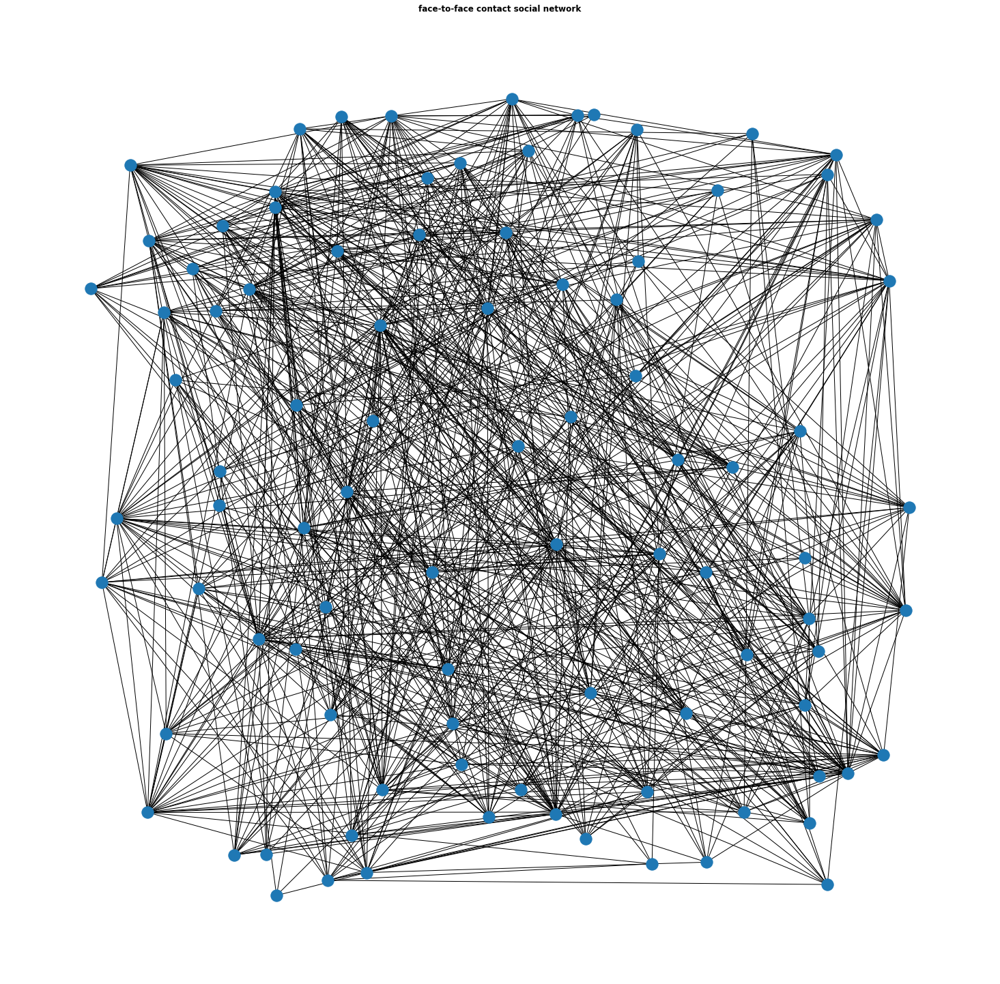

In [ ]:
plt.subplots(figsize=(26,26))
sizes=[G.neighbors(n) for n in G.nodes()]
pos = nx.spring_layout(G, k=0.80, iterations=1)
nx.draw(G,pos)
plt.title("face-to-face contact social network",fontweight="bold")
plt.show()

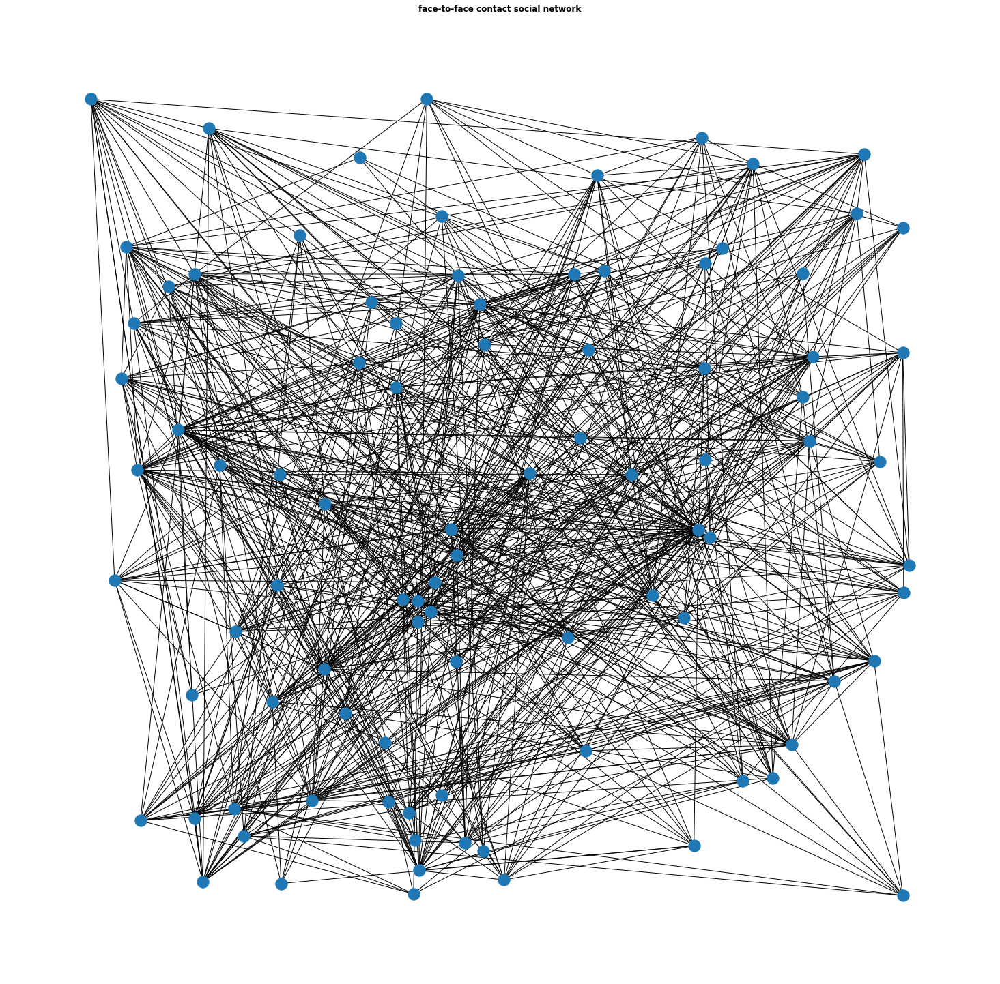

In [ ]:
plt.subplots(figsize=(26,26))
#pos = nx.spring_layout(G, k=0.90, iterations=1)
pos= nx.random_layout(G)
nx.draw(G,pos)
plt.title("face-to-face contact social network",fontweight="bold")
plt.show()

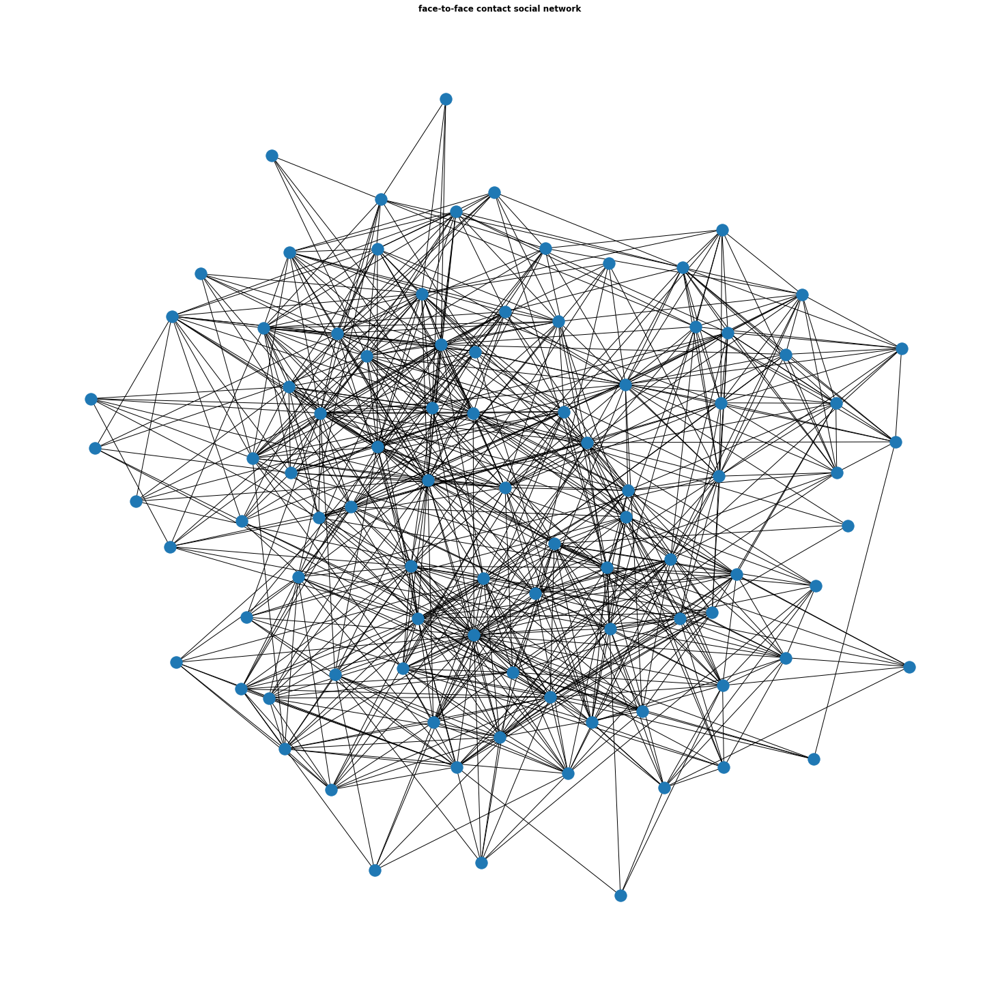

In [ ]:
plt.subplots(figsize=(26,26))
pos= nx.kamada_kawai_layout(G)
nx.draw(G,pos)
plt.title("face-to-face contact social network",fontweight="bold")
plt.show()

## **6-Network analysis**

In [ ]:
#create graph structure
G=nx.Graph()
#add nodes
#G.add_nodes_from(node)
#add edges
for idx,row in df2.iterrows():
  t= int(row['t'])
  left = int(row['i'])
  right= int(row['j'])
  if dupli[idx]==False:
    G.add_edge(left,right,time=t)


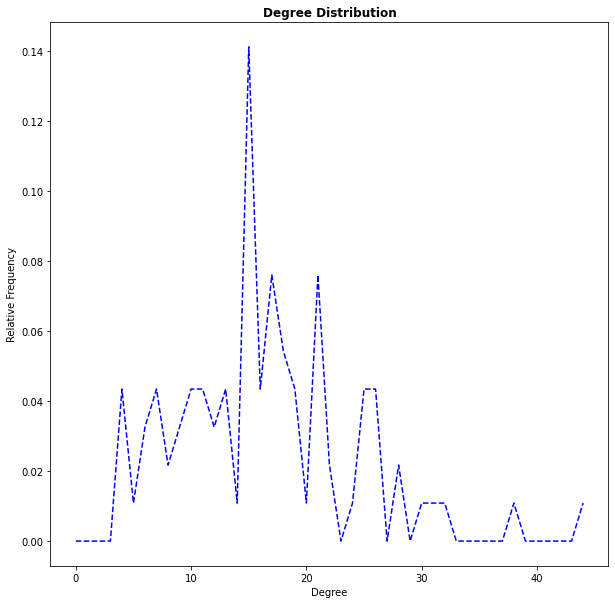

In [ ]:
#Degree associativity 
degree_freq = nx.degree_histogram(G)

tempY=nx.degree_histogram(G)
tempX=list(range(len(tempY))) #isolated node's degree = 0
X=[];Y=[]

degrees = range(len(degree_freq))
plt.figure(figsize=(10, 10)) 
tot=sum(degree_freq[0:])
for i in range(1,len(tempY)):
        if tempY[i]!=0:
            Y.append(tempY[i])
            X.append(tempX[i])
degree_freq=[i/tot for i in degree_freq]

plt.plot(degrees[0:], degree_freq[0:],'b--') 
plt.xlabel('Degree')
plt.ylabel('Relative Frequency')
plt.title('Degree Distribution',fontweight ="bold")
plt.savefig('DegreeAssortativity.png')
plt.show()

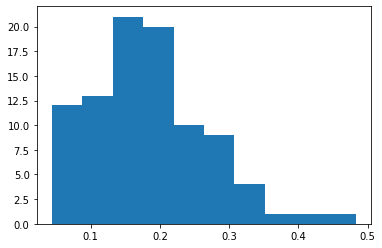

In [ ]:
#degree centrality 
deg_cent = nx.degree_centrality(G) # GET DISCITONARY OF DEGREE CENTRALITY 
plt.figure()
plt.hist(list(deg_cent.values())) # MAKE LIST OF DEGREE CENTRALITY VALUES 
plt.show()

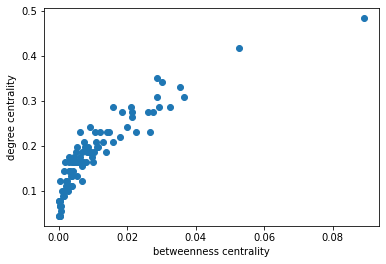

In [ ]:
#betweeness centrality 
bet_cen = nx.betweenness_centrality(G) # GET THE DICTIONARY OF BETWEENNESS CENTRALITY
plt.scatter(list(bet_cen.values()),list(deg_cent.values()))
plt.xlabel('betweenness centrality')
plt.ylabel('degree centrality')
plt.show()

In [ ]:
def find_nodes_with_highest_deg_cent(G):

    deg_cent = nx.degree_centrality(G)
    max_dc = max(list(deg_cent.values())) 
    nodes = set()
    for k, v in deg_cent.items():
        if v == max_dc:
            nodes.add(k)

    return nodes

def find_node_with_highest_bet_cent(G):

    bet_cent = nx.betweenness_centrality(G)
    max_bc = max(list(bet_cent.values()))
    nodes = set()
    for k, v in bet_cent.items():
        if v == max_bc:
            nodes.add(k)

    return nodes


In [ ]:
top_dc = find_nodes_with_highest_deg_cent(G)
print(top_dc)
top_bc = find_node_with_highest_bet_cent(G)
print(top_bc)

{804}
{804}


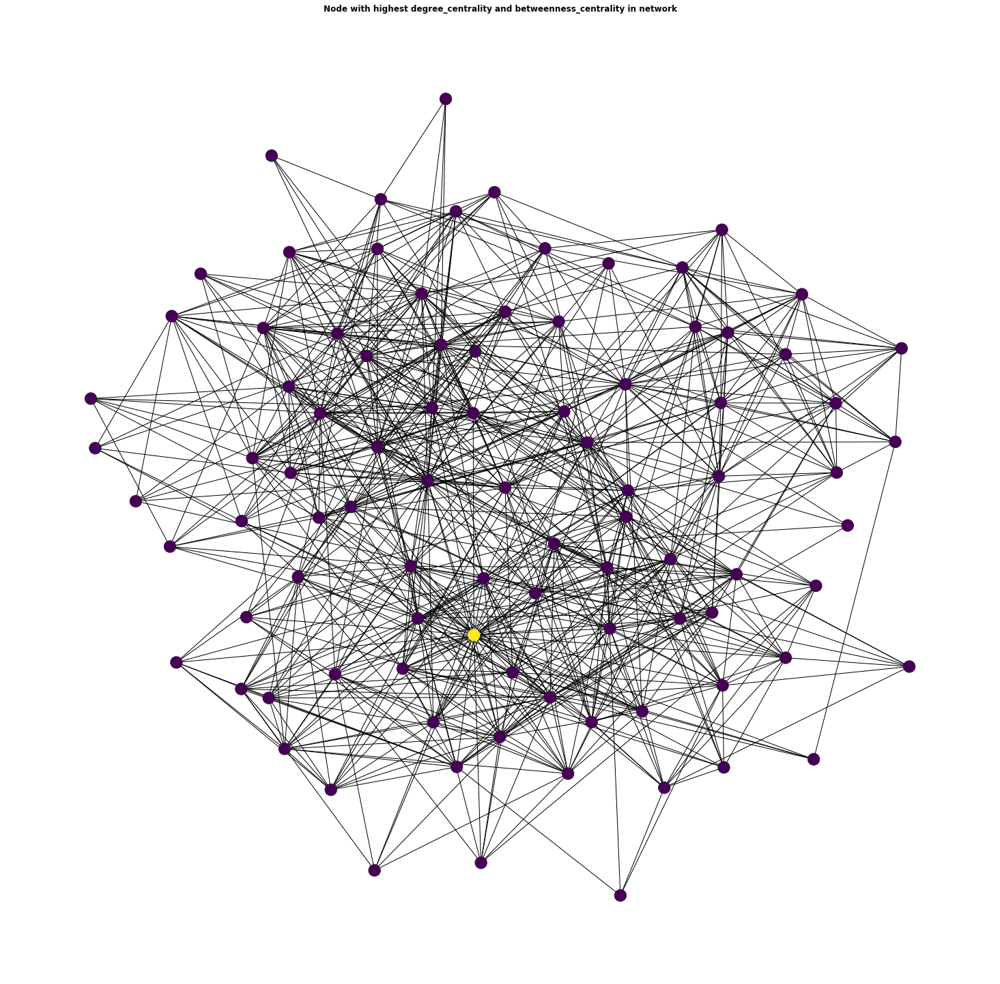

In [ ]:
plt.subplots(figsize=(26,26))
pos= nx.kamada_kawai_layout(G)
colors_list=[0 for i in range(len(list(G.nodes())))]
idx = (list(G.nodes)).index(804)
colors_list[idx]=1
nx.draw(G,pos,cmap=cmap,node_color=colors_list)
plt.title("Node with highest degree_centrality and betweenness_centrality in network",fontweight="bold")
plt.show()

In [ ]:
dic_departements[804]

'DMCT'

In [ ]:
len(list(G.neighbors(804)))

44

## **7-Community Detection**

partition.values():  dict_values([0, 1, 2, 2, 2, 3, 2, 0, 2, 1, 2, 0, 2, 2, 2, 1, 2, 3, 1, 2, 2, 1, 0, 2, 1, 0, 0, 2, 2, 1, 3, 0, 0, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 3, 1, 1, 0, 2, 1, 2, 2, 2, 1, 0, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 3, 0, 3, 3, 0, 2, 3, 3, 3, 3, 3, 3, 1, 3, 2, 0, 1, 2, 2, 3, 0, 2, 3, 1])
modularity:  0.38491557387833863
degree_assortativity_coefficient:  -0.05859349307136975


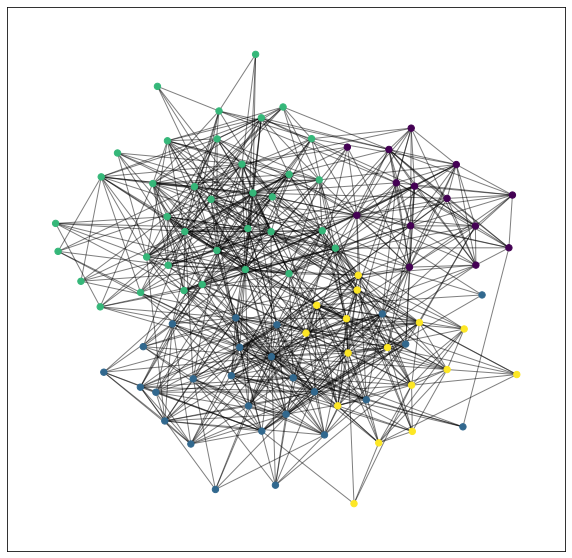

In [ ]:
from community import community_louvain
partition = community_louvain.best_partition(G)

# draw the graph
f = plt.figure(figsize=(10, 10))
ax = f.add_subplot(1,1,1)
#pos = nx.spring_layout(G) 
pos= nx.kamada_kawai_layout(G)
# color the nodes according to their partition
print('partition.values(): ',partition.values())
cmap = plt.cm.get_cmap('viridis', max(partition.values()) + 1)
nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=40, 
                       cmap=cmap, node_color=list(partition.values()),ax=ax)
nx.draw_networkx_edges(G, pos,alpha=0.5)

modularity = community_louvain.modularity(partition, G, weight='weight')
print('modularity: ',modularity)
r = nx.degree_assortativity_coefficient(G)
print('degree_assortativity_coefficient: ',r)
plt.show()

In [ ]:
partition.items()

dict_items([(492, 0), (938, 1), (267, 2), (272, 2), (181, 2), (826, 3), (79, 2), (150, 0), (196, 2), (21, 1), (205, 2), (448, 0), (765, 2), (39, 2), (253, 2), (80, 1), (123, 2), (845, 3), (118, 1), (311, 2), (95, 2), (771, 1), (153, 0), (164, 2), (179, 1), (481, 0), (122, 0), (120, 2), (819, 2), (431, 1), (778, 3), (271, 0), (601, 0), (15, 2), (56, 2), (194, 2), (786, 2), (603, 2), (496, 2), (275, 1), (222, 2), (50, 1), (172, 2), (29, 2), (223, 2), (116, 3), (285, 1), (762, 1), (63, 0), (939, 2), (335, 1), (105, 2), (113, 2), (513, 2), (119, 1), (154, 0), (494, 2), (48, 1), (209, 1), (17, 1), (66, 1), (102, 1), (134, 1), (240, 1), (242, 2), (804, 1), (511, 1), (875, 1), (184, 3), (499, 0), (268, 3), (185, 3), (533, 0), (987, 2), (210, 3), (35, 3), (131, 3), (211, 3), (751, 3), (265, 3), (784, 1), (273, 3), (662, 2), (709, 0), (101, 1), (779, 2), (132, 2), (255, 3), (213, 0), (791, 2), (743, 3), (87, 1)])

In [ ]:
meta_df = pd.DataFrame (  metaContent, columns = ['ID','Category'])
meta_df['ID'] = meta_df['ID'].astype(int)
meta_df

,ID,Category
0,35,DISQ
1,184,DISQ
2,751,DISQ
3,255,DISQ
4,131,DISQ
...,...,...
87,601,SRH
88,271,SRH
89,63,SRH
90,150,SRH


In [ ]:
data_classified = pd.DataFrame (  partition.items(), columns = ['ID','Cluster'])
data_classified['ID'] = data_classified['ID'].astype(int)
data_classified

,ID,Cluster
0,492,0
1,938,1
2,267,2
3,272,2
4,181,2
...,...,...
87,255,3
88,213,0
89,791,2
90,743,3


In [ ]:
result=pd.merge(data_classified, meta_df, on='ID', how='left')
result.to_csv('LouvainAlgo_classificationMerge.csv')
print(result)

     ID  Cluster Category
0   492        0      SRH
1   938        1     DMCT
2   267        2      DSE
3   272        2      DSE
4   181        2      DSE
..  ...      ...      ...
87  255        3     DISQ
88  213        0     SFLE
89  791        2      DSE
90  743        3     DISQ
91   87        1     SFLE

[92 rows x 3 columns]


In [ ]:
nodes_list=[]
nodes_dict_cluster={}
for index, row in result.iterrows():
  #print(row['Cluster'])
  nodes_list.append(node(int(row['ID']),int(row['Cluster'])))
  nodes_dict_cluster[int(row['ID'])] = int(row['Cluster'])

In [ ]:
nodes_list[3].cluster

2

##**8-SRI Model**

In [ ]:
#result
for person in nodes_list:
  values=dict_neighbours.get(person.id)
  print(values)
  cont_internal=0
  cont_external=0
  for neighbour in values:
    print("cluster neighour "+str(neighbour)+": "+str(nodes_dict_cluster.get(neighbour)))
    if(person.cluster==nodes_dict_cluster.get(neighbour)):
      person.internal=person.internal+1
    else:
      person.external=person.external+1




[938, 601, 123, 271, 153, 154, 448, 499, 119, 63]
cluster neighour 938: 1
cluster neighour 601: 0
cluster neighour 123: 2
cluster neighour 271: 0
cluster neighour 153: 0
cluster neighour 154: 0
cluster neighour 448: 0
cluster neighour 499: 0
cluster neighour 119: 1
cluster neighour 63: 0
[492, 240, 804, 431, 875]
cluster neighour 492: 0
cluster neighour 240: 1
cluster neighour 804: 1
cluster neighour 431: 1
cluster neighour 875: 1
[272, 222, 311, 205, 496, 223, 184, 39, 603, 164, 120, 939, 105, 513, 116, 56, 95, 662, 196, 15, 211, 63, 134, 79, 29]
cluster neighour 272: 2
cluster neighour 222: 2
cluster neighour 311: 2
cluster neighour 205: 2
cluster neighour 496: 2
cluster neighour 223: 2
cluster neighour 184: 3
cluster neighour 39: 2
cluster neighour 603: 2
cluster neighour 164: 2
cluster neighour 120: 2
cluster neighour 939: 2
cluster neighour 105: 2
cluster neighour 513: 2
cluster neighour 116: 3
cluster neighour 56: 2
cluster neighour 95: 2
cluster neighour 662: 2
cluster neighour 

In [ ]:
nodes_list[0].external

3

In [ ]:
residents=[]
linkers=[]
wanderers =[]
for person in nodes_list:
  total_neighbours=person.internal+person.external
  if((person.internal>person.external) and (person.internal>(0.6*total_neighbours))):
    residents.append(person)
  elif((person.external>person.internal) and (person.external>(0.6*total_neighbours))):
    wanderers.append(person)
  else:
    linkers.append(person)




In [ ]:
print("total linkers: "+str(len(linkers))+ ", total residents: "+str(len(residents))+" , wanderers: "+str(len(wanderers)))

total linkers: 22, total residents: 66 , wanderers: 4


In [ ]:
for linker in linkers:
  print("linker id: "+str(linker.id)+" , #internal: "+str(linker.internal)+" , #external:"+str(linker.external))

linker id: 826 , #internal: 13 , #external:13
linker id: 150 , #internal: 11 , #external:11
linker id: 448 , #internal: 9 , #external:6
linker id: 765 , #internal: 9 , #external:6
linker id: 253 , #internal: 9 , #external:7
linker id: 80 , #internal: 17 , #external:14
linker id: 123 , #internal: 13 , #external:13
linker id: 118 , #internal: 4 , #external:5
linker id: 311 , #internal: 22 , #external:16
linker id: 222 , #internal: 13 , #external:12
linker id: 285 , #internal: 9 , #external:6
linker id: 63 , #internal: 13 , #external:15
linker id: 105 , #internal: 6 , #external:4
linker id: 119 , #internal: 11 , #external:10
linker id: 154 , #internal: 10 , #external:7
linker id: 134 , #internal: 16 , #external:14
linker id: 804 , #internal: 21 , #external:23
linker id: 184 , #internal: 11 , #external:10
linker id: 131 , #internal: 8 , #external:9
linker id: 751 , #internal: 10 , #external:7
linker id: 265 , #internal: 11 , #external:14
linker id: 255 , #internal: 9 , #external:11


In [ ]:
for resident in residents:
  print("resident id: "+str(resident.id)+" , #internal: "+str(resident.internal)+" , #external:"+str(resident.external))

resident id: 492 , #internal: 7 , #external:3
resident id: 938 , #internal: 4 , #external:1
resident id: 267 , #internal: 20 , #external:5
resident id: 272 , #internal: 4 , #external:0
resident id: 181 , #internal: 13 , #external:3
resident id: 79 , #internal: 13 , #external:8
resident id: 196 , #internal: 12 , #external:5
resident id: 21 , #internal: 10 , #external:5
resident id: 205 , #internal: 12 , #external:5
resident id: 39 , #internal: 19 , #external:6
resident id: 845 , #internal: 6 , #external:3
resident id: 95 , #internal: 26 , #external:6
resident id: 771 , #internal: 11 , #external:4
resident id: 153 , #internal: 12 , #external:6
resident id: 164 , #internal: 8 , #external:4
resident id: 179 , #internal: 12 , #external:1
resident id: 481 , #internal: 9 , #external:4
resident id: 122 , #internal: 7 , #external:4
resident id: 120 , #internal: 21 , #external:1
resident id: 819 , #internal: 15 , #external:0
resident id: 431 , #internal: 12 , #external:5
resident id: 778 , #inte

In [ ]:
for wanderer in wanderers:
  print("wanderer id: "+str(wanderer.id)+" , #internal: "+str(wanderer.internal)+" , #external:"+str(wanderer.external))

wanderer id: 116 , #internal: 5 , #external:14
wanderer id: 211 , #internal: 7 , #external:11
wanderer id: 213 , #internal: 2 , #external:5
wanderer id: 87 , #internal: 1 , #external:3


5.999999999999999
done with simulation, now plotting


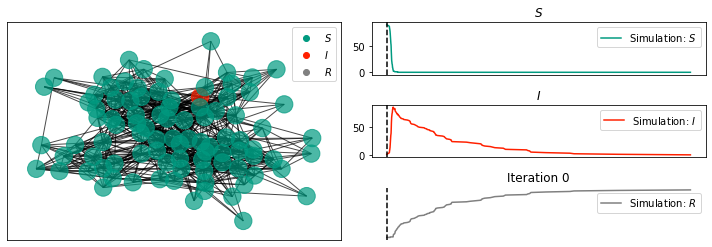

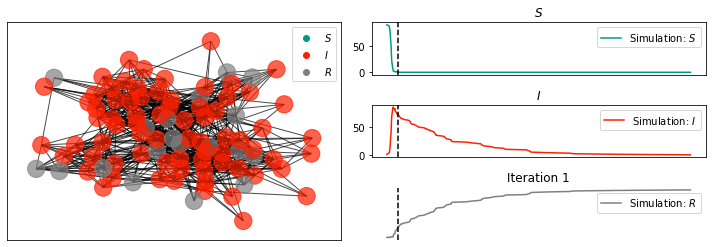

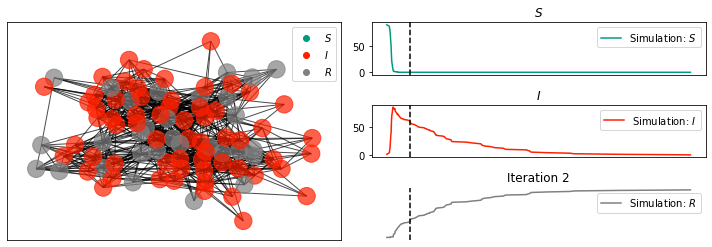

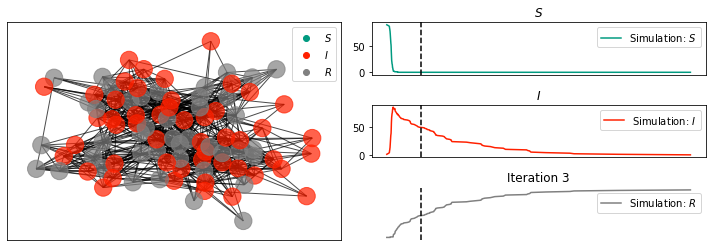

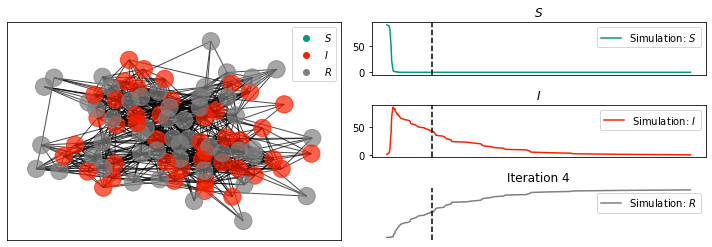

In [ ]:
gamma = 0.2  
beta = 1.2 
r_0 = beta/gamma
print(r_0)
N = 100 # population size
I0 = 1   # intial n° of infected individuals 
R0 = 0
S0 = N - I0 -R0

#edgewidth = [d[2] for (u,v,d) in G.edges(data=True)]
edgewidth=1

pos = nx.spring_layout(G)
#nx_kwargs = {"with_labels":True, "pos": pos, "width": edgewidth, "alpha": 0.7} #optional arguments to be passed on to the
nx_kwargs = {"pos": pos, "alpha": 0.7} #optional arguments to be passed on to the

#networkx plotting command.print("doing Gillespie simulation")
sim = EoN.Gillespie_SIR(G, tau = beta, gamma=gamma, rho = I0/N, return_full_data=True)
print("done with simulation, now plotting")

for i in range(0,5,1):
    sim.display(time = i,  **nx_kwargs)
    plt.axis('off') 
    plt.title("Iteration {}".format(i))
    plt.draw()

In [ ]:
nodes2=[]
df2['i'] = df2['i'].astype(int)
df2['j'] = df2['j'].astype(int)

for i in df2['i'].unique():
  if i in dic_departements.keys():

    nodes2.append(i)

for i in df2['j'].unique():
  if i in dic_departements.keys():
    nodes2.append(i)
nodes
nodes2=list(set(nodes2))
for item in nodes2:
  for linker in linkers:
    if(linker.id in nodes2):
      nodes2.remove(linker.id)

#get number of nodes in the graph
len(nodes2)

70

In [ ]:
len(linkers)

22

In [ ]:
#create graph structure
dict_neighbours={}
G2=nx.Graph()
#add nodes
#G.add_nodes_from(node)
#add edges
for idx,row in df2.iterrows():
  t= int(row['t'])
  left = int(row['i'])
  right= int(row['j'])
  if (left not in dict_neighbours):
    dict_neighbours[left]=[]
  if(right not in dict_neighbours):
    dict_neighbours[right]=[]
  
  if (dupli[idx]==False and ((left in nodes2) and (right in nodes2))):
    if(right not in dict_neighbours.get(left)):
      dict_neighbours[left].append(right)
    if(left not in dict_neighbours.get(right)):
      dict_neighbours[right].append(left)
    G2.add_edge(left,right,time=t)

5.999999999999999
done with simulation, now plotting


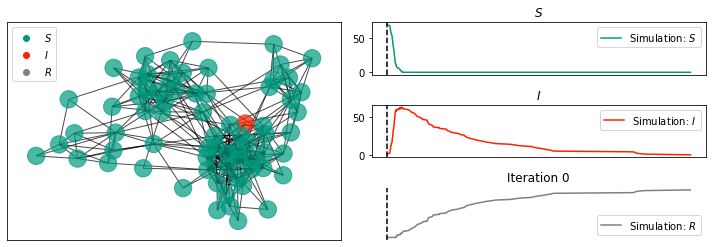

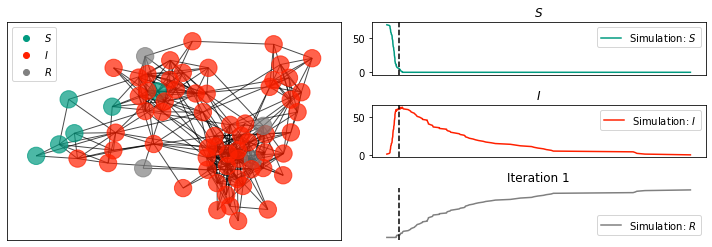

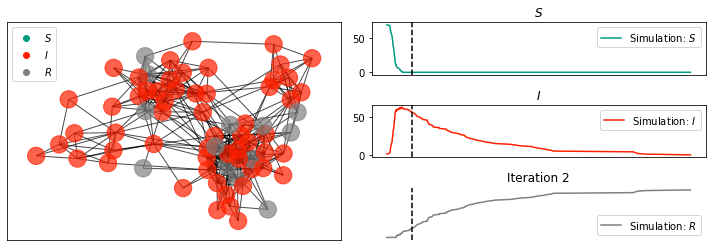

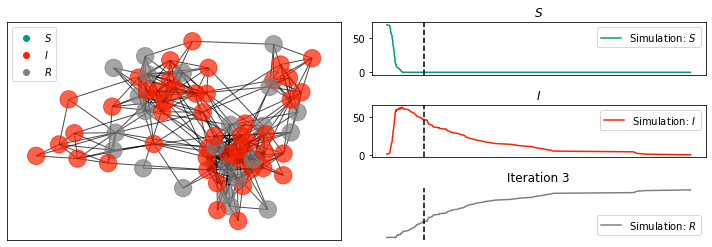

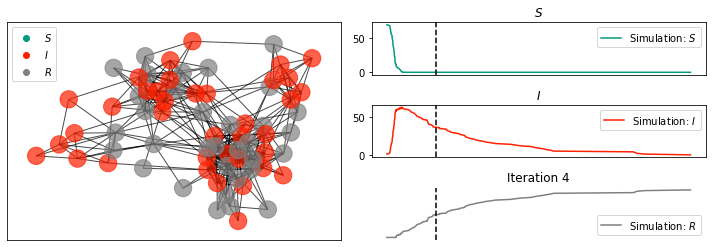

In [ ]:
gamma = 0.2  
beta = 1.2 
r_0 = beta/gamma
print(r_0)
N = 100 # population size
I0 = 1   # intial n° of infected individuals 
R0 = 0
S0 = N - I0 -R0

edgewidth=1

pos = nx.spring_layout(G2)
nx_kwargs = {"pos": pos, "alpha": 0.7} #optional arguments to be passed on to the

#networkx plotting command.print("doing Gillespie simulation")
sim = EoN.Gillespie_SIR(G2, tau = beta, gamma=gamma, rho = I0/N, return_full_data=True)
print("done with simulation, now plotting")

for i in range(0,5,1):
    sim.display(time = i,  **nx_kwargs)
    plt.axis('off') 
    plt.title("Iteration {}".format(i))
    plt.draw()

In [ ]:
deg_cent = nx.degree_centrality(G) # GET DICTIONARY OF DEGREE CENTRALITY 
deg_cent=(sorted(deg_cent.items(), key=lambda item: item[1], reverse=True)[:22])
print(deg_cent)
top_deg_cent = {k: v for k, v in deg_cent}
print(top_deg_cent)

[(804, 0.4835164835164836), (311, 0.4175824175824176), (95, 0.3516483516483517), (80, 0.34065934065934067), (134, 0.3296703296703297), (223, 0.3076923076923077), (63, 0.3076923076923077), (826, 0.28571428571428575), (123, 0.28571428571428575), (875, 0.28571428571428575), (662, 0.28571428571428575), (267, 0.27472527472527475), (39, 0.27472527472527475), (222, 0.27472527472527475), (265, 0.27472527472527475), (29, 0.26373626373626374), (150, 0.2417582417582418), (120, 0.2417582417582418), (79, 0.23076923076923078), (56, 0.23076923076923078), (194, 0.23076923076923078), (496, 0.23076923076923078)]
{804: 0.4835164835164836, 311: 0.4175824175824176, 95: 0.3516483516483517, 80: 0.34065934065934067, 134: 0.3296703296703297, 223: 0.3076923076923077, 63: 0.3076923076923077, 826: 0.28571428571428575, 123: 0.28571428571428575, 875: 0.28571428571428575, 662: 0.28571428571428575, 267: 0.27472527472527475, 39: 0.27472527472527475, 222: 0.27472527472527475, 265: 0.27472527472527475, 29: 0.26373626373

In [ ]:
nodes3=[]
df2['i'] = df2['i'].astype(int)
df2['j'] = df2['j'].astype(int)

for i in df2['i'].unique():
  if i in dic_departements.keys():

    nodes3.append(i)

for i in df2['j'].unique():
  if i in dic_departements.keys():
    nodes3.append(i)

nodes3=list(set(nodes3))
for item in nodes3:
  #print(item)
  if(item in top_deg_cent):
    nodes3.remove(item)

#get number of nodes in the graph
len(nodes3)

75

5.999999999999999
done with simulation, now plotting


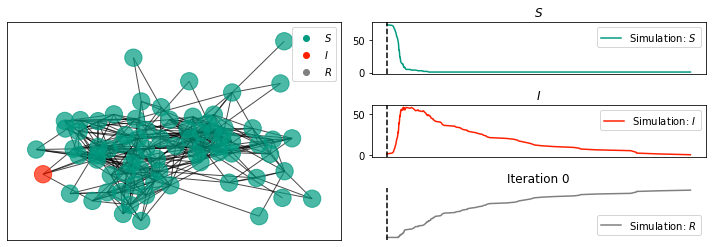

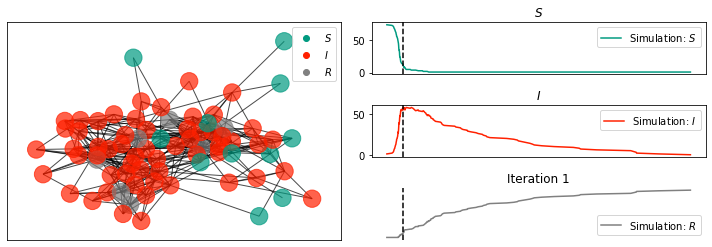

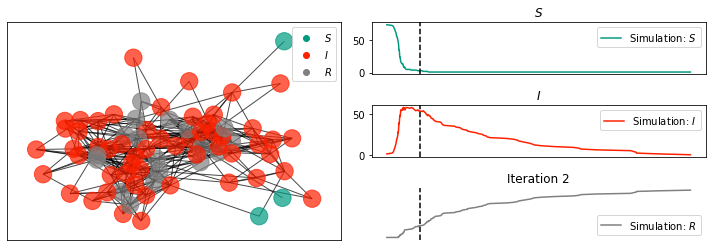

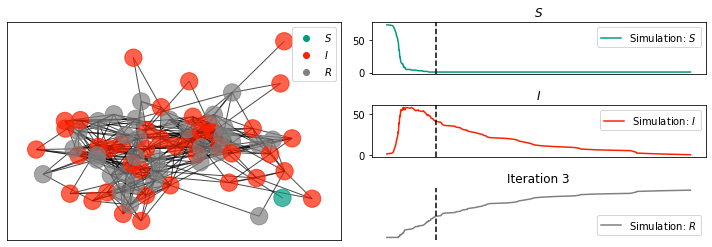

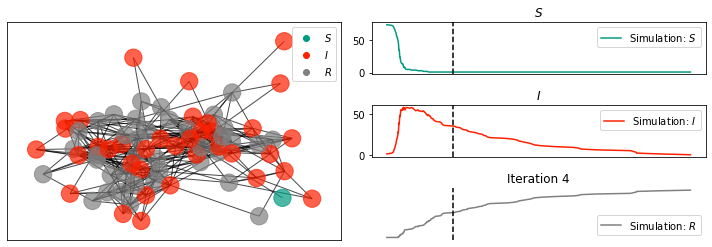

In [ ]:
#create graph structure
dict_neighbours={}
G3=nx.Graph()

#add edges
for idx,row in df2.iterrows():
  t= int(row['t'])
  left = int(row['i'])
  right= int(row['j'])
  if (left not in dict_neighbours):
    dict_neighbours[left]=[]
  if(right not in dict_neighbours):
    dict_neighbours[right]=[]
  
  if (dupli[idx]==False and ((left in nodes3) and (right in nodes3))):
    if(right not in dict_neighbours.get(left)):
      dict_neighbours[left].append(right)
    if(left not in dict_neighbours.get(right)):
      dict_neighbours[right].append(left)
    G3.add_edge(left,right,time=t)



gamma = 0.2  
beta = 1.2 
r_0 = beta/gamma
print(r_0)
N = 100 # population size
I0 = 1   # intial n° of infected individuals 
R0 = 0
S0 = N - I0 -R0

edgewidth=1

pos = nx.spring_layout(G3)
nx_kwargs = {"pos": pos, "alpha": 0.7} #optional arguments to be passed on to the

#networkx plotting command.print("doing Gillespie simulation")
sim = EoN.Gillespie_SIR(G3, tau = beta, gamma=gamma, rho = I0/N, return_full_data=True)
print("done with simulation, now plotting")

for i in range(0,5,1):
    sim.display(time = i,  **nx_kwargs)
    plt.axis('off') 
    plt.title("Iteration {}".format(i))
    plt.draw()

In [ ]:
#betweeness centrality 
bet_cen = nx.betweenness_centrality(G) # GET THE DICTIONARY OF BETWEENNESS CENTRALITY
bet_cen=sorted(bet_cen.items(), key=lambda x: x[1], reverse=True)[:22]
print(bet_cen)
top_bet_cen = {k: v for k, v in bet_cen}
print(top_bet_cen)

[(804, 0.08899555608000675), (311, 0.052648510544335544), (63, 0.03670355473656327), (134, 0.03549859686839397), (123, 0.032542447534903374), (80, 0.030052577125088895), (826, 0.029332415871834258), (95, 0.02876448730536089), (223, 0.028762015752429343), (265, 0.027587912867947578), (56, 0.026658383346370586), (39, 0.026214301319482797), (119, 0.022685428033267434), (29, 0.021366803133859868), (267, 0.021268274798241938), (875, 0.02124746693196078), (150, 0.019859393163651054), (222, 0.01860246691207548), (255, 0.017876915850301798), (102, 0.015809871132640187), (662, 0.015785268211060747), (184, 0.014790098688989386)]
{804: 0.08899555608000675, 311: 0.052648510544335544, 63: 0.03670355473656327, 134: 0.03549859686839397, 123: 0.032542447534903374, 80: 0.030052577125088895, 826: 0.029332415871834258, 95: 0.02876448730536089, 223: 0.028762015752429343, 265: 0.027587912867947578, 56: 0.026658383346370586, 39: 0.026214301319482797, 119: 0.022685428033267434, 29: 0.021366803133859868, 267:

In [ ]:
nodes4=[]
df2['i'] = df2['i'].astype(int)
df2['j'] = df2['j'].astype(int)

for i in df2['i'].unique():
  if i in dic_departements.keys():

    nodes4.append(i)

for i in df2['j'].unique():
  if i in dic_departements.keys():
    nodes4.append(i)

nodes4=list(set(nodes4))
for item in nodes4:
  #print(item)
  if(item in top_bet_cen):
    nodes4.remove(item)

#get number of nodes in the graph
len(nodes4)

74

5.999999999999999
done with simulation, now plotting


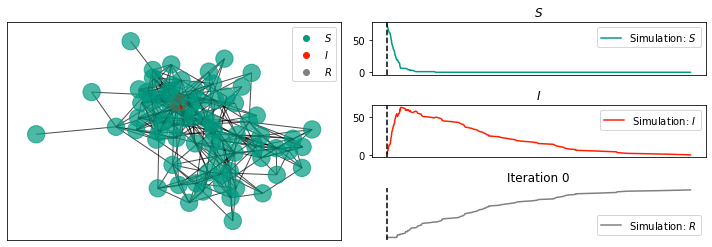

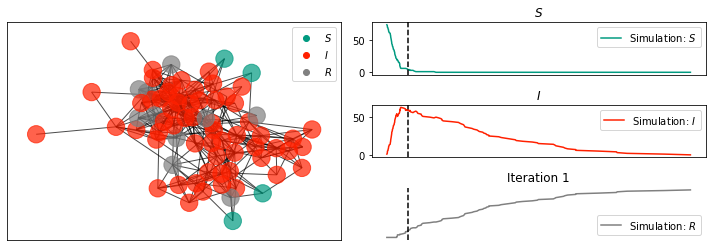

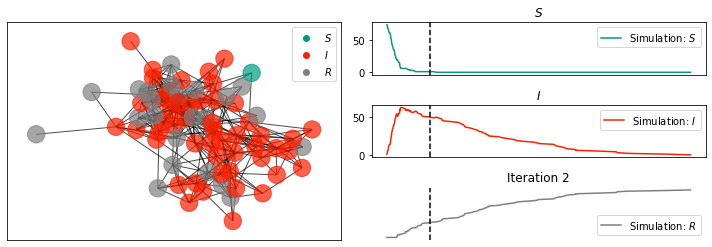

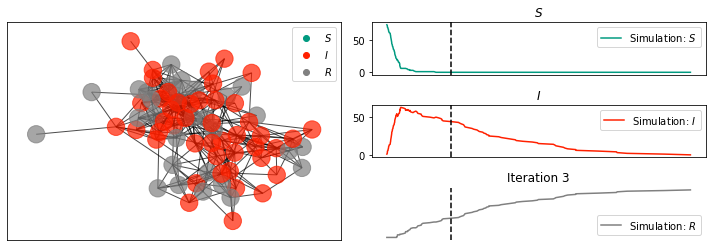

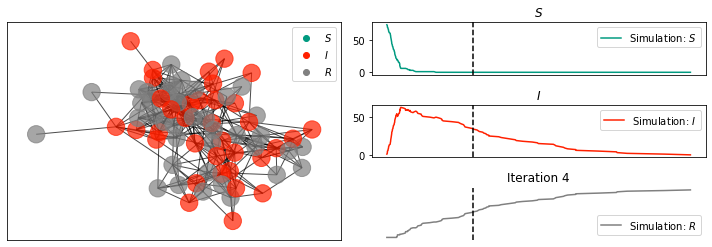

In [ ]:
#create graph structure
dict_neighbours={}
G4=nx.Graph()
#add nodes
#G.add_nodes_from(node)
#add edges
for idx,row in df2.iterrows():
  t= int(row['t'])
  left = int(row['i'])
  right= int(row['j'])
  if (left not in dict_neighbours):
    dict_neighbours[left]=[]
  if(right not in dict_neighbours):
    dict_neighbours[right]=[]
  
  if (dupli[idx]==False and ((left in nodes4) and (right in nodes4))):
    if(right not in dict_neighbours.get(left)):
      dict_neighbours[left].append(right)
    if(left not in dict_neighbours.get(right)):
      dict_neighbours[right].append(left)
    G4.add_edge(left,right,time=t)




gamma = 0.2  
beta = 1.2 
r_0 = beta/gamma
print(r_0)
N = 100 # population size
I0 = 1   # intial n° of infected individuals 
R0 = 0
S0 = N - I0 -R0

edgewidth=1

pos = nx.spring_layout(G4)
nx_kwargs = {"pos": pos, "alpha": 0.7} #optional arguments to be passed on to the

#networkx plotting command.print("doing Gillespie simulation")
sim = EoN.Gillespie_SIR(G4, tau = beta, gamma=gamma, rho = I0/N, return_full_data=True)
print("done with simulation, now plotting")

for i in range(0,5,1):
    sim.display(time = i,  **nx_kwargs)
    plt.axis('off') 
    plt.title("Iteration {}".format(i))
    plt.draw()